In [36]:
import sys
import pandas as pd
sys.path.append("../scripts")
from Eda import Eda as eda
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
data = pd.read_csv("../data/Week1_challenge_data_source.csv")
eda = eda(data)

In [3]:
data['Session frequency'] = data.groupby(['Bearer Id'])['Dur. (ms)'].transform('count')

In [4]:
data = eda.convertbyte_scale(data, '(Bytes)', '(MB)', 1000000)
data['Total_Data_Volume(MB)'] = data['Total DL (MB)'] + data['Total UL (MB)']

In [5]:
km = KMeans(n_clusters=3,)

In [6]:
df = pd.DataFrame()
df['Session frequency'] = data['Session frequency']
df["Total_Data"] = data['Total_Data_Volume(MB)']
df['Dur. (s)'] = data['Dur. (ms)']/1000
df['MSISDN/Number'] = data['MSISDN/Number']

In [7]:
df['Session frequency'] = df['Session frequency'].fillna(df['Session frequency'].mean())
df.dropna(inplace=True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 148935 entries, 0 to 149999
Data columns (total 4 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Session frequency  148935 non-null  float64
 1   Total_Data         148935 non-null  float64
 2   Dur. (s)           148935 non-null  float64
 3   MSISDN/Number      148935 non-null  float64
dtypes: float64(4)
memory usage: 5.7 MB


In [59]:
session = df.groupby('MSISDN/Number',as_index=False).agg({"Session frequency": sum})

In [60]:
session.nlargest(10, ['Session frequency'])

,MSISDN/Number,Session frequency
13180,3.362578e+10,631130.0
13526,3.362632e+10,615990.0
37052,3.365973e+10,591742.0
6437,3.361489e+10,565827.0
76363,3.367588e+10,545943.0
92923,3.376054e+10,537395.0
65118,3.366716e+10,484263.0
106137,3.378632e+10,448236.0
92577,3.376041e+10,438464.0
13994,3.362708e+10,436327.0


In [62]:
total_data = df.groupby(['MSISDN/Number'],as_index=False).agg({'Total_Data': sum})

In [63]:
total_data.nlargest(10, ['Total_Data'])

,MSISDN/Number,Total_Data
6437,3.361489e+10,8846.227
92923,3.376054e+10,8514.774
13180,3.362578e+10,8499.620
13526,3.362632e+10,7971.171
76363,3.367588e+10,7891.112
37052,3.365973e+10,7705.862
63028,3.366646e+10,7308.502
92577,3.376041e+10,7132.371
57241,3.366471e+10,6872.016
86455,3.369879e+10,6540.900


In [64]:
Duration = df.groupby(['MSISDN/Number'],as_index=False).agg({'Dur. (s)': sum})

In [65]:
Duration.nlargest(10, ['Dur. (s)'])

,MSISDN/Number,Dur. (s)
13180,3.362578e+10,18553.754
6437,3.361489e+10,9966.898
92923,3.376054e+10,9279.434
13526,3.362632e+10,8791.927
65118,3.366716e+10,8744.914
50281,3.366284e+10,6614.270
57160,3.366469e+10,6288.730
666,3.360313e+10,6287.761
66029,3.366746e+10,5649.882
92577,3.376041e+10,5321.667


##### TASK 2.1

###### Normalize and perfrom kmeans

In [15]:
df_norm = (df-df.min())/ (df.max() - df.min())

In [16]:
df_norm

,Session frequency,Total_Data,Dur. (s),MSISDN/Number
0,0.879716,0.341601,0.980734,7.248773e-08
1,0.879716,0.731616,0.733164,9.163196e-08
2,0.879716,0.300676,0.731360,1.809067e-07
3,0.879716,0.928123,0.709627,1.692517e-07
4,0.879716,0.624280,0.584100,1.119654e-07
...,...,...,...,...
149995,0.933257,0.910225,0.028315,7.666544e-08
149996,0.743248,0.650301,0.040000,5.631124e-08
149997,1.000000,0.730104,0.049038,7.077383e-08
149998,0.879716,0.645872,0.049189,2.367322e-08


In [17]:
prediction = km.fit_predict(df[['Total_Data', 'Dur. (s)', 'Session frequency']])
prediction

array([0, 0, 0, ..., 0, 0, 0])

In [18]:
df['cluster'] = prediction 

df1 = df[df.cluster==0]
df2 = df[df.cluster==1]
df3 = df[df.cluster==2]

In [19]:
engage = ['Total_Data', 'Dur. (s)', 'Session frequency']

In [20]:
print('For Cluster 0')
for i in engage:
    print(df1[i].describe())
print('For Cluster 1')
for i in engage:
    print(df2[i].describe())
print('For Cluster 2')
for i in engage:
    print(df3[i].describe())

For Cluster 0
count    112605.000000
mean        495.582594
std         244.366968
min          28.956000
25%         284.700000
50%         496.639000
75%         706.304000
max         955.985000
Name: Total_Data, dtype: float64
count    112605.000000
mean        115.491702
std          84.998957
min           7.142000
25%          74.442000
50%          92.443000
75%         147.355000
max        1859.336000
Name: Dur. (s), dtype: float64
count    112605.000000
mean      37516.920851
std        1973.642957
min       34424.765465
25%       35114.000000
50%       37251.000000
75%       39915.000000
max       39915.000000
Name: Session frequency, dtype: float64
For Cluster 1
count    7050.000000
mean      497.427695
std       242.628296
min        49.379000
25%       289.338000
50%       501.672000
75%       703.778250
max       946.486000
Name: Total_Data, dtype: float64
count    7050.000000
mean       55.774831
std        32.550602
min         7.146000
25%        26.094250
50%       

###### Aggregate user total traffic

In [21]:
df['Google_total (MB)'] = data['Google DL (MB)'] + data['Google UL (MB)']
df['Social_total (MB)'] = data['Social Media DL (MB)'] + data['Social Media UL (MB)']
df['Email_total (MB)'] = data['Email DL (MB)'] + data['Email UL (MB)']
df['Youtube_total (MB)'] = data['Youtube DL (MB)'] + data['Youtube UL (MB)']
df['Netflix_total (MB)'] = data['Netflix DL (MB)'] + data['Netflix UL (MB)']
df['Gaming_total (MB)'] = data['Gaming DL (MB)'] + data['Gaming UL (MB)']
df['Other_total (MB)'] = data['Other DL (MB)'] + data['Other UL (MB)']

In [22]:
relevant_apps = ['Google_total (MB)',
       'Social_total (MB)', 'Email_total (MB)', 'Youtube_total (MB)',
       'Netflix_total (MB)', 'Gaming_total (MB)']

In [23]:
eda.groupby(df, relevant_apps, 'MSISDN/Number', 10)

       Google_total (MB)  MSISDN/Number
25058             15.529   3.363243e+10
25057             15.518   3.366485e+10
25056             15.508   3.366092e+10
25055             15.507   3.365976e+10
25054             15.507   3.366466e+10
25053             15.506   3.366733e+10
25052             15.494   3.366775e+10
25051             15.483   3.377121e+10
25050             15.481   3.366485e+10
25049             15.479   6.731276e+10
      Social_total (MB)  MSISDN/Number
6529              3.651   3.366178e+10
6528              3.650   3.375024e+10
6527              3.649   1.009207e+11
6526              3.648   3.366237e+10
6525              3.648   6.742356e+10
6524              3.647   6.730763e+10
6523              3.647   6.736797e+10
6522              3.646   2.019609e+11
6521              3.645   6.733042e+10
6520              3.644   6.736816e+10
      Email_total (MB)  MSISDN/Number
8256             4.518   3.362815e+10
8255             4.513   1.009846e+11
8254             

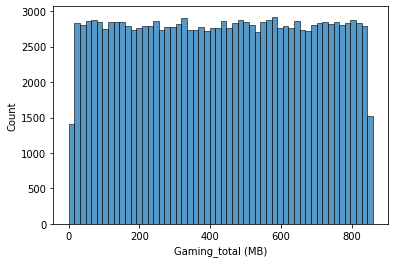

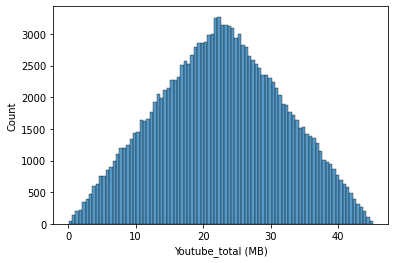

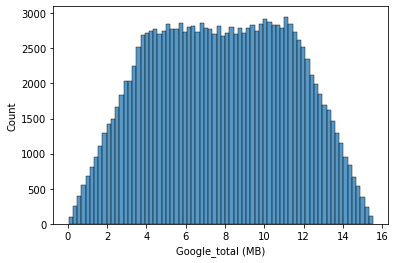

In [34]:
top_3 = ['Gaming_total (MB)', 'Youtube_total (MB)', 'Google_total (MB)']
for cols in top_3:
    sns.histplot(data=df, x=cols)
    plt.show()

In [48]:
for cols in top_3:
    fig = px.histogram(df, x=cols)
    fig.show()

In [49]:
dfs = pd.DataFrame()
dfs['Total_Data'] = df['Total_Data']
dfs['Session frequency'] = df['Session frequency']
dfs['Dur (s)'] = df['Dur. (s)']

In [55]:
import numpy as np
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)
from scipy.spatial.distance import cdist
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(dfs)
    kmeanModel.fit(dfs)
 
    distortions.append(sum(np.min(cdist(dfs, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / dfs.shape[0])
    inertias.append(kmeanModel.inertia_)
 
    mapping1[k] = sum(np.min(cdist(dfs, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / dfs.shape[0]
    mapping2[k] = kmeanModel.inertia_

In [57]:
for key, val in mapping1.items():
    print(f'{key} : {val}')

1 : 4675.338947826691
2 : 2913.552560691794
3 : 1425.0486326970763
4 : 710.5003140043253
5 : 283.5385116235868
6 : 227.30378889724895
7 : 201.0585641232234
8 : 177.67640375591262
9 : 152.53454347659996


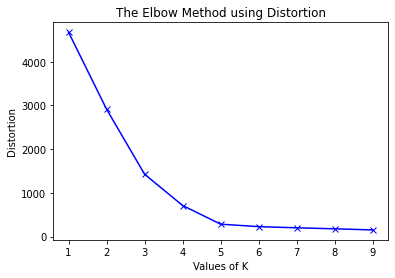

In [56]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()